# V928 Tau - Translucent Disk

In this notebook we take the output of the stellar variation notebook and model the eclipse. We do this using the <strong>pyPplusS</strong> package designed by Rein & Odir 2019. We make the assumption that the two components of the binary are identical and thus that the deblended light curve just doubles the fluctuations about 1. Here we use the translucent disk model.

In [1]:
import emcee
import logging
import numpy as np
import astropy.units as u
import astropy.constants as c
import matplotlib.pyplot as plt
from Code import mcmc, eclipse

%matplotlib inline

## Load the Data

In [2]:
time, flux_b, flux, error = eclipse.load_data('data/photometry/eclipse_lightcurve.txt')

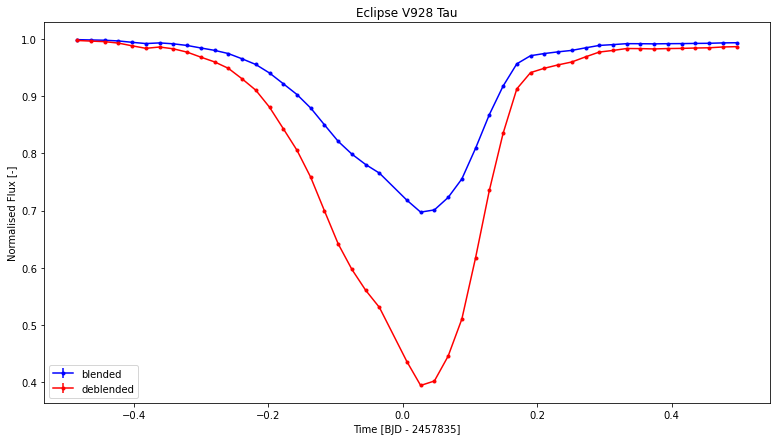

In [3]:
plt.figure(figsize=(13, 7))
plt.title('Eclipse V928 Tau')
plt.xlabel('Time [BJD - 2457835]')
plt.ylabel('Normalised Flux [-]')
plt.errorbar(time, flux_b, yerr=error, fmt='.', color='b', ls='-', label='blended')
plt.errorbar(time, flux, yerr=error, fmt='.', color='r', ls='-', label='deblended')
plt.legend()
plt.show()

## Model Set-up

This takes the <strong>disk_model()</strong> function from <strong>eclipse_functions</strong>, and creates sub-functions for the translucent disk ($r_{\mathrm{edge}} = 0, \ \tau_{\mathrm{edge}} = 0$).

In [4]:
# model functions
pack_td = lambda rd, b, inc, tilt, vel, dx, taud: (rd, 0., b, inc, tilt, vel, dx, taud, 0.)
translucent_disk = lambda P, time: eclipse.disk_model(pack_td(*P), time)
translucent_prior = lambda P: eclipse.disk_prior(pack_td(*P))

In [5]:
# Bounds of the parameters (t = tilt, T = tau, rest as above)
rl, ru = (0., 10.)
bl, bu = (-10.,10.)
il, iu = (0., np.pi/2.)
tl, tu = (0., np.pi/2.)
vl, vu = (5.9, 20.)
xl, xu = (-10.,10.)
Tl, Tu = (0.,1.)

## Translucent Disk

In [6]:
# Set up parameter labels, units and bounds for the translucent disk
lbls_td = ['disk radius', 'impact parameter', 'inclination', 'tilt', 'velocity', 
           'time shift', 'disk opacity']
units_td = ['R*', 'R*', 'deg', 'deg', 'R*/day', 'day', '-']
bounds_td = [(rl, ru/2.), (bl/2., bu/2.), (iu/2., iu), (tl, tu), (vl, vu/2.), 
             (-0.5, 0.5), (Tu/2., Tu)]

# determine an initial guess for the MCMC distribution for the translucent disk
pargs_td = (7, 1000, bounds_td)
p0_td = eclipse.useful_p0(mcmc.bounded_p0, pargs_td, translucent_disk, time, False, 4)


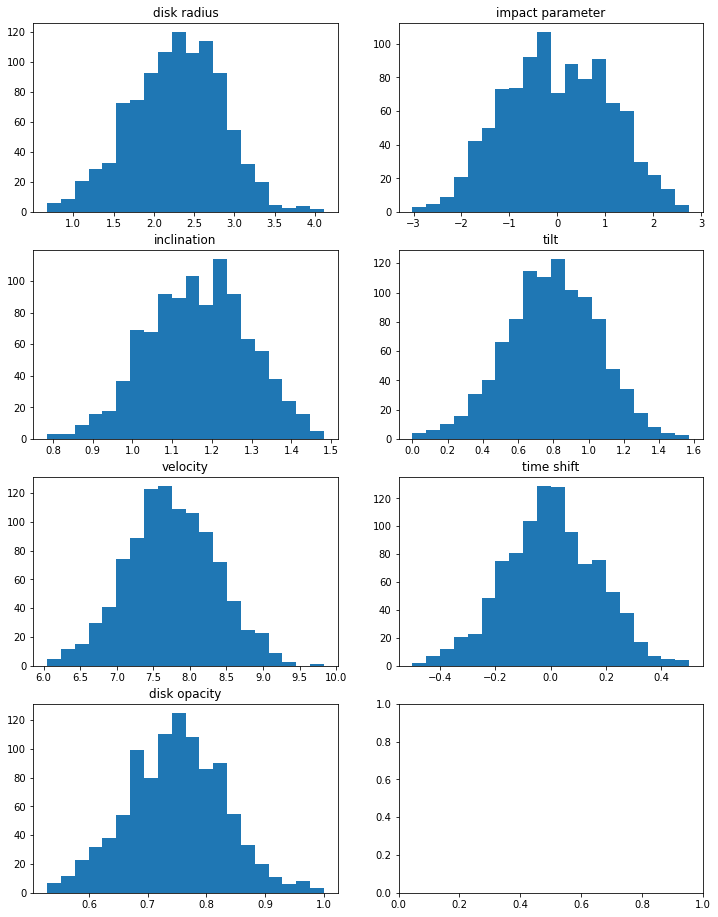

In [7]:
# plot the solutions for the translucent disk
mcmc.plot_hist(p0_td, lbls=lbls_td)

In [8]:
# mcmc parameters for the translucent disk
be_td = 'models/mcmc_backends/translucent_disk.h5'
args_td = (time, flux, error, translucent_disk, translucent_prior)
BE_td = emcee.backends.HDFBackend(be_td)

# run mcmc for the translucent disk
#p_td, sampler_td = mcmc.run_mcmc(*args_td, p0_td, 1500, reset=False, savename=be_td)

# load mcmc for the translucent disk
sampler_td = emcee.EnsembleSampler(1000, 7, mcmc.lnprob, args=args_td, backend=BE_td)


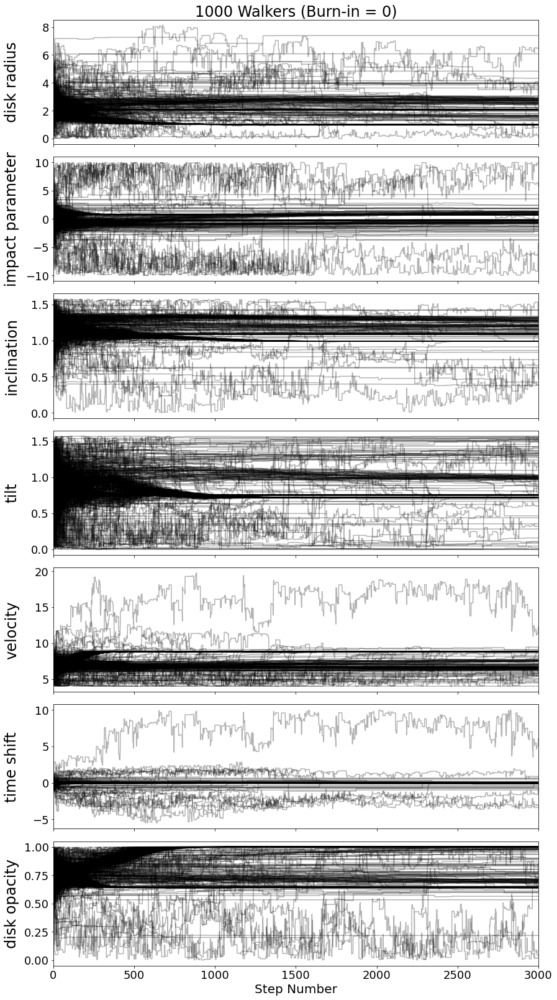

In [9]:
# plot the walkers for the translucent disk
mcmc.plot_walkers(sampler_td, lbls=lbls_td)

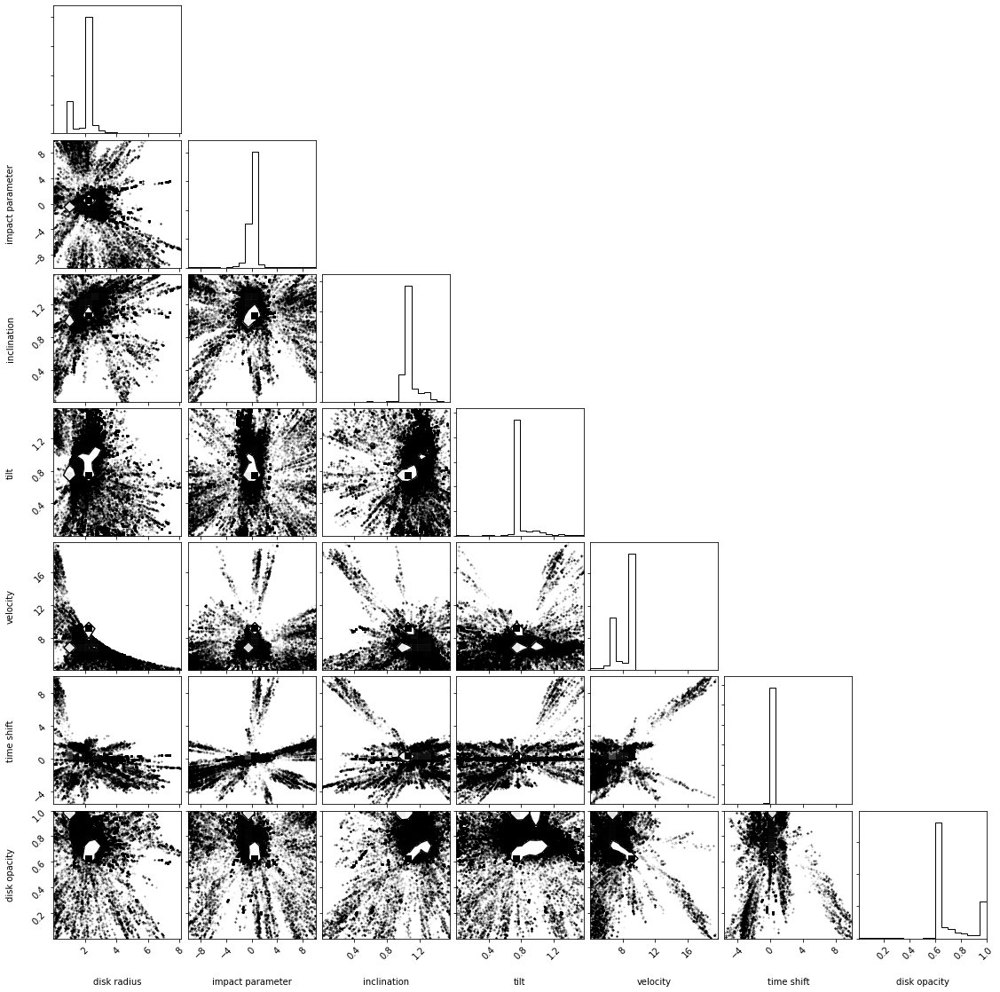

In [10]:
# plot the triangle for the translucent disk
mcmc.plot_triangle(sampler_td, lbls=lbls_td)

Here we clearly see two solutions separated and as before we'll start by separating by velocity. Ironically we again see a split at about 8 $R_*$/day.

### Separating Solutions (Velocity) for the Translucent Disk

Here we extract the solutions with velocities below and above 8 $R_*$/day.

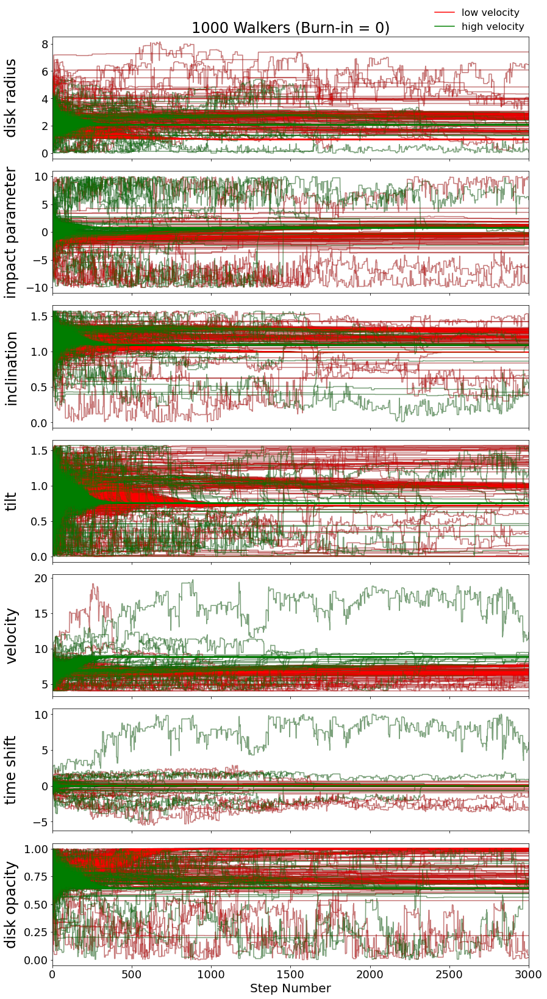

In [11]:
# extracting low and high velocity solutions for the translucent disk
vel_names_td = ['low velocity', 'high velocity']
lvel_td, hvel_td = mcmc.extract_solutions(sampler_td, [4, 4], [(0, 8), (8, 20)], 0, lbls_td, vel_names_td)

#### High Velocity Solutions for the Translucent Disk

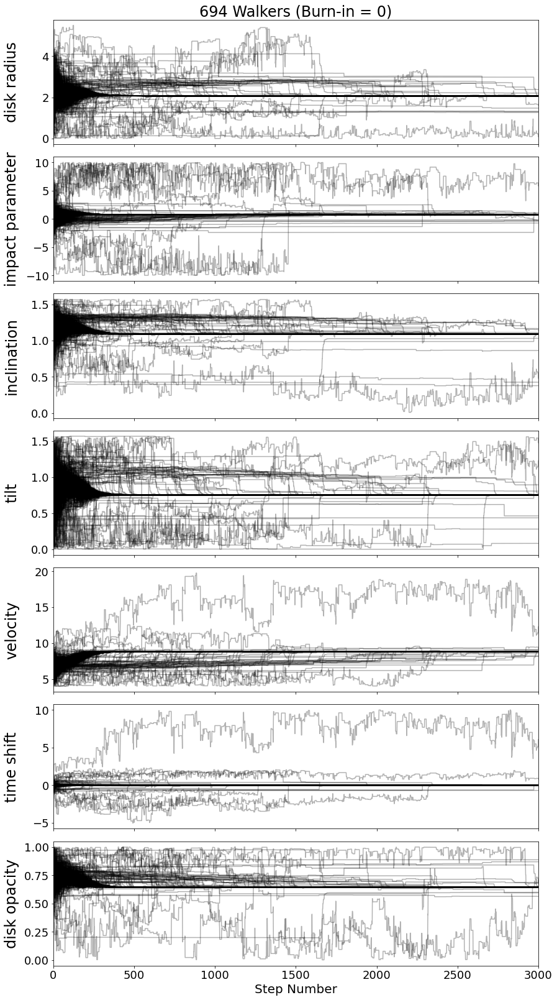

In [12]:
# plot the high velocity walkers for the translucent disk
mcmc.plot_walkers(hvel_td, lbls=lbls_td)

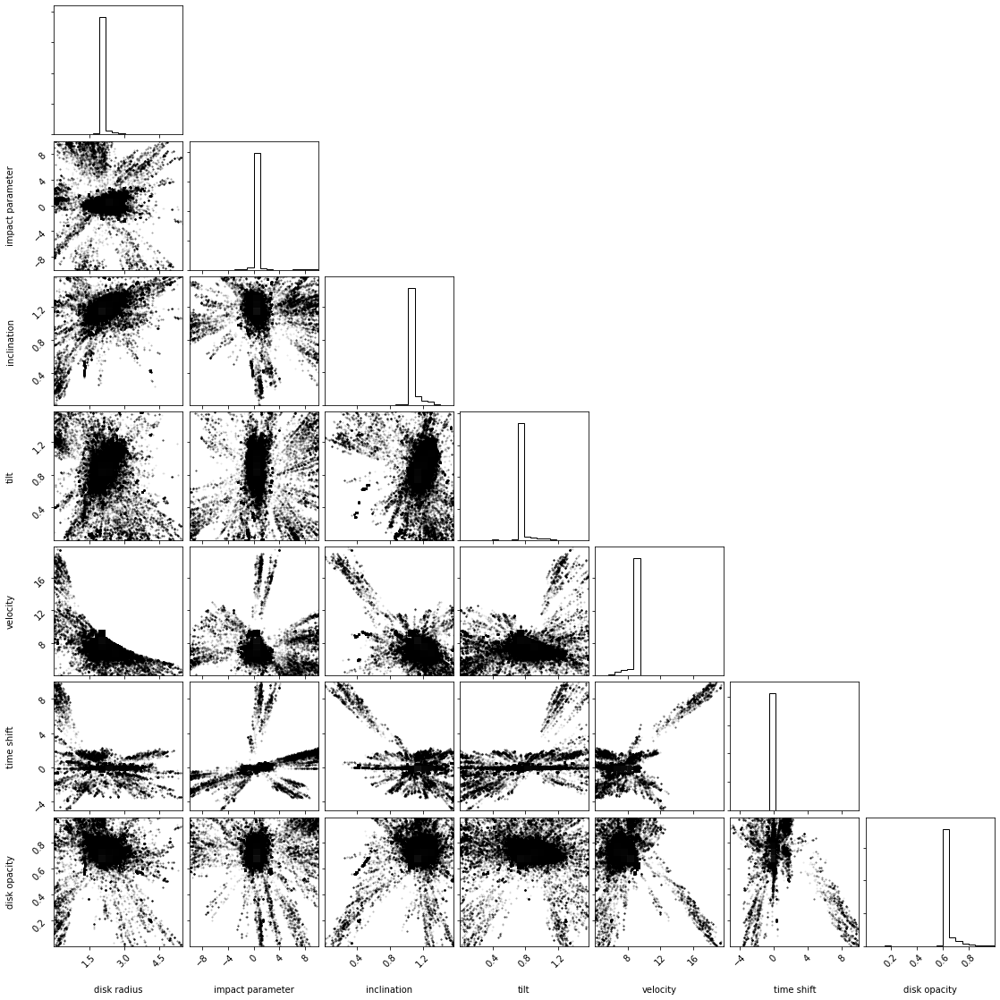

In [13]:
# plot the high velocity triangle for the translucent disk
mcmc.plot_triangle(hvel_td, lbls=lbls_td)

This clearly has but one solution.

100%|██████████| 500/500 [00:45<00:00, 11.10it/s]


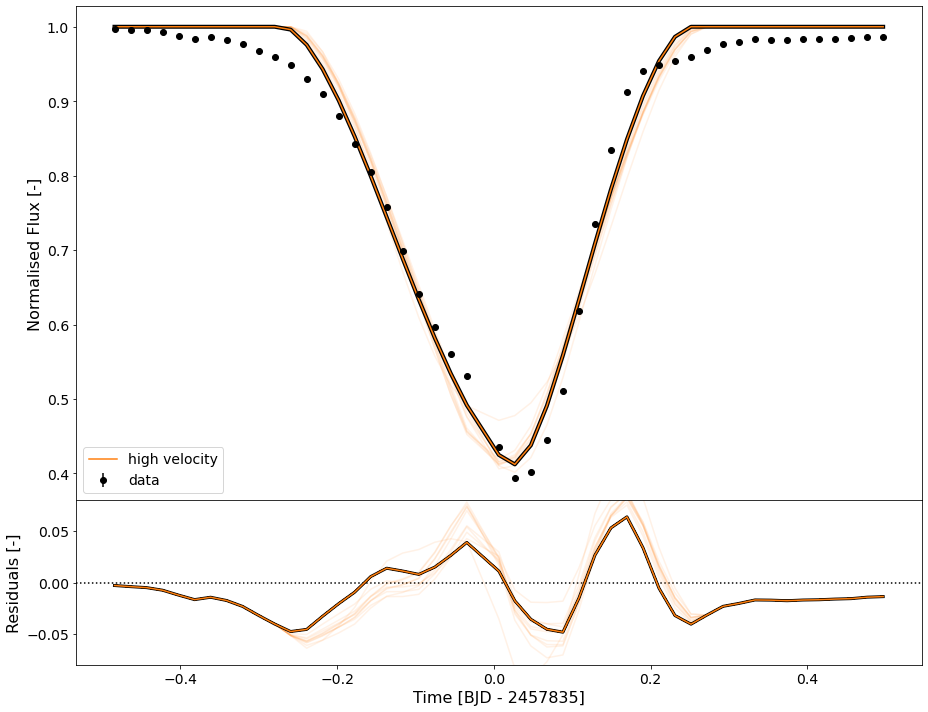

In [14]:
# determine the burn-in for the high velocity solutions for the translucent disk
cut_hvel_td = 500

# carry out statistics for the high velocity solutions for the translucent disk
stats_hvel_td, pb_hvel_td = mcmc.stats(hvel_td, cut=cut_hvel_td)

# plot the samples for the high velocity solutions for the translucent disk
_ = mcmc.plot_samples(time, flux, error, [translucent_disk], [hvel_td], ['high velocity'], cut_hvel_td, 500,
                      best_fit=True, dt=3002, residual_lims=(-0.08, 0.08))

In [15]:
# print the high velocity best fit parameters for the translucent disk
mcmc.print_parameters(pb_hvel_td, lbls_td, units_td)

disk radius        =     +2.071857     [R*]
impact parameter   =     +0.722407     [R*]
inclination        =     +62.47948     [deg]
tilt               =     +43.23963     [deg]
velocity           =     +8.826365     [R*/day]
time shift         =     -0.046670     [day]
disk opacity       =     +0.643868     [-]


#### Low Velocity Solutions for the Translucent Disk

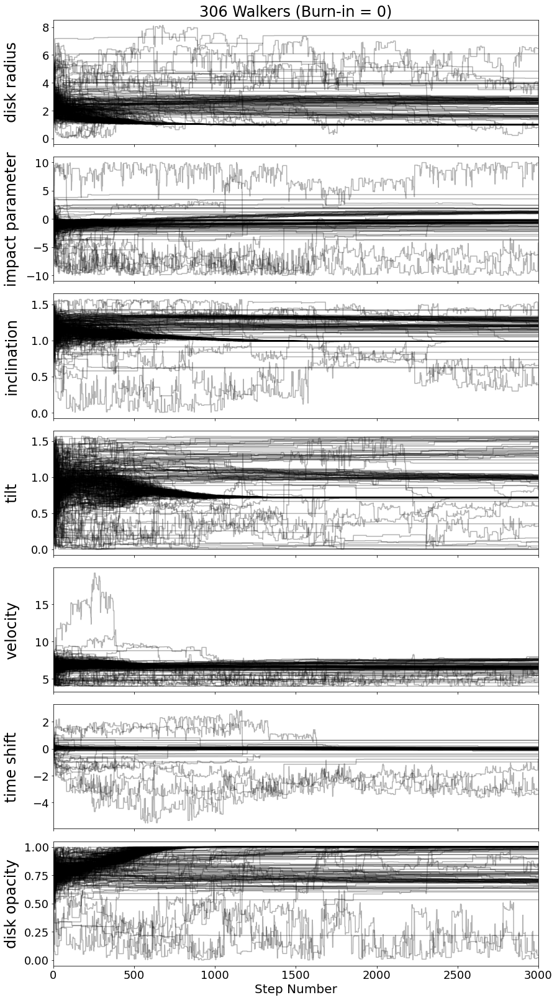

In [16]:
# plot the low velocity walkers for the translucent disk
mcmc.plot_walkers(lvel_td, lbls=lbls_td)

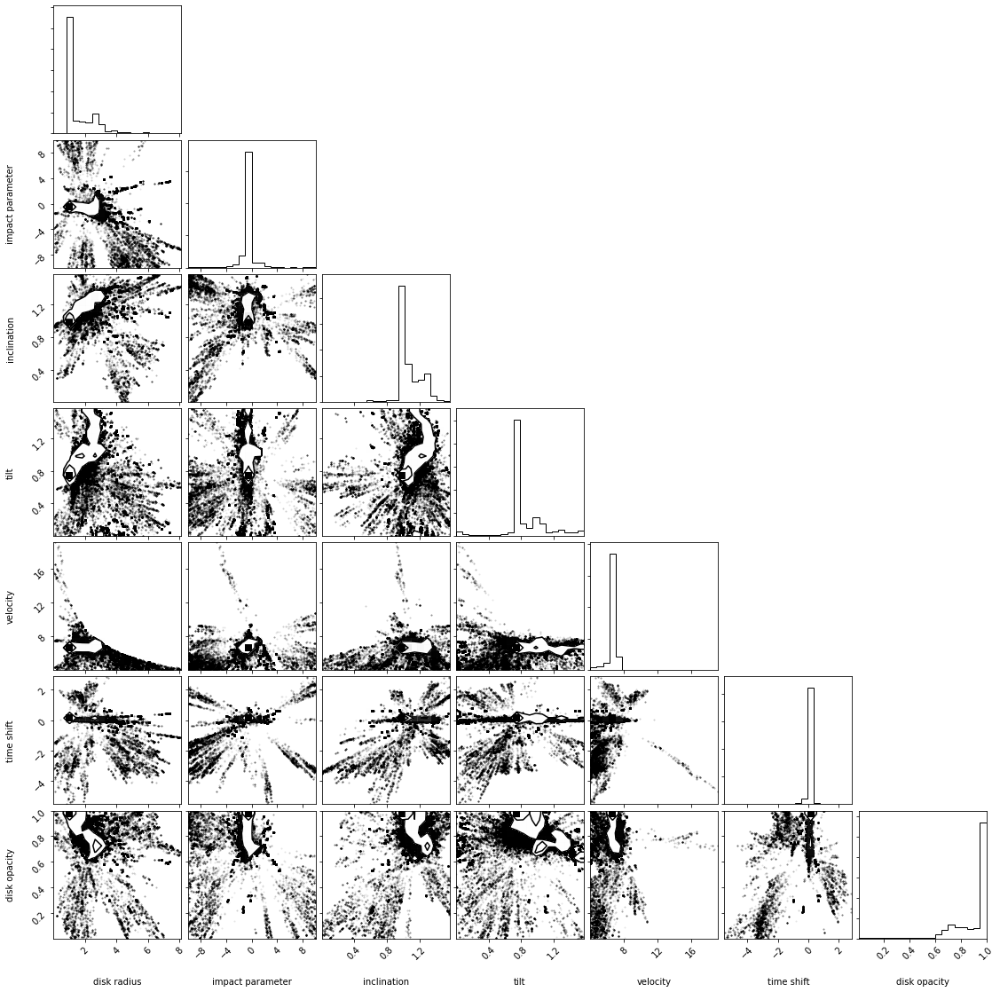

In [17]:
# plot the low velocity triangle for the translucent disk
mcmc.plot_triangle(lvel_td, lbls=lbls_td)

There is a sign of two solutions, which we can investigate. We see this in radius, inclination and tilt. As before we perform a radius split, as we are interested in small disks.

### Separating Low Velocity Solutions (Disk Radius) for the Translucent Disk

Here we extract the solutions with a disk radius above and below 2 $R_*$.

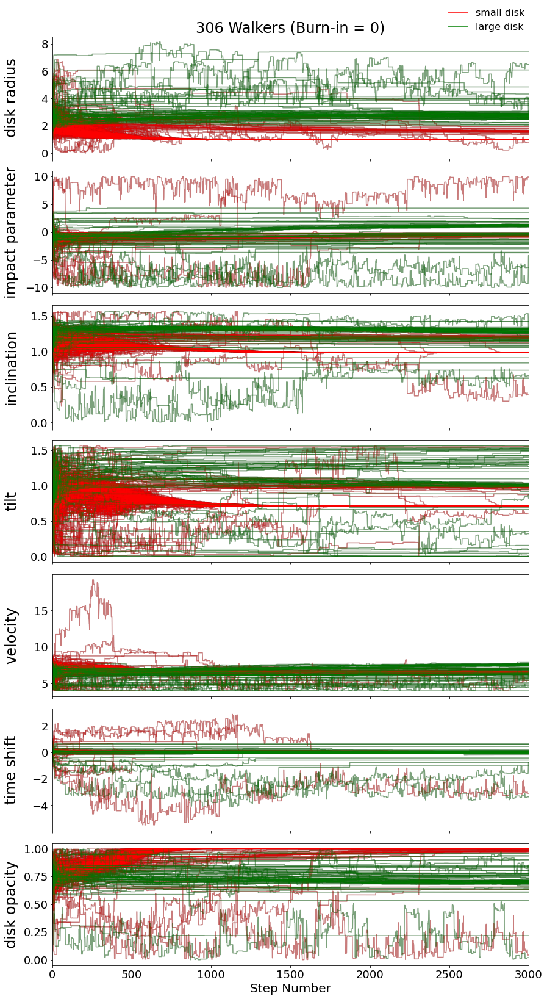

In [18]:
# extracting disk radius for the low velocity solutions of the translucent disk
dr_names_td = ['small disk', 'large disk']
ldr_td, hdr_td = mcmc.extract_solutions(lvel_td, [0, 0], [(0, 2), (2, 20)], 0, lbls_td, dr_names_td)

#### Low Velocity, High Disk Radii Solutions for the Translucent Disk

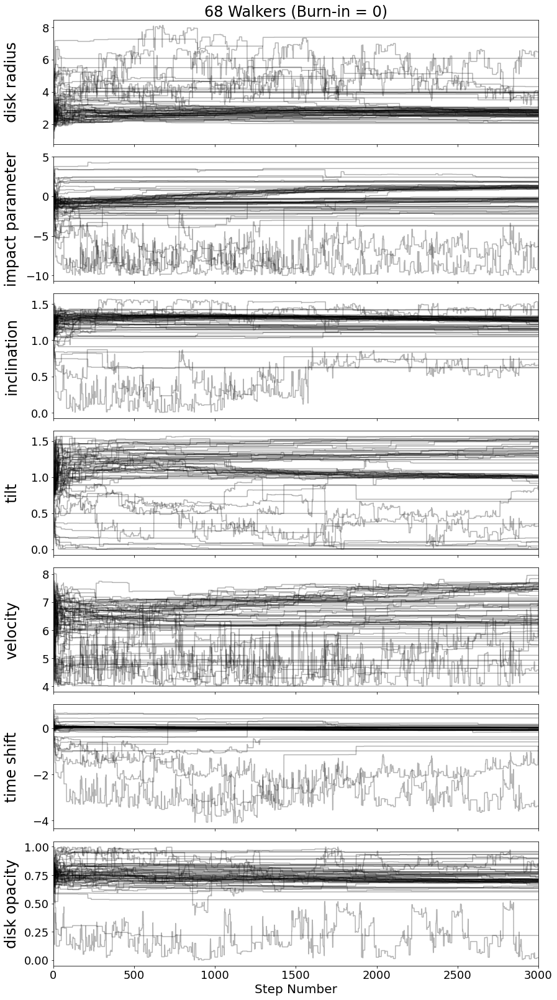

In [19]:
# plot the low velocity high disk radii walkers for the translucent disk
mcmc.plot_walkers(hdr_td, lbls=lbls_td)

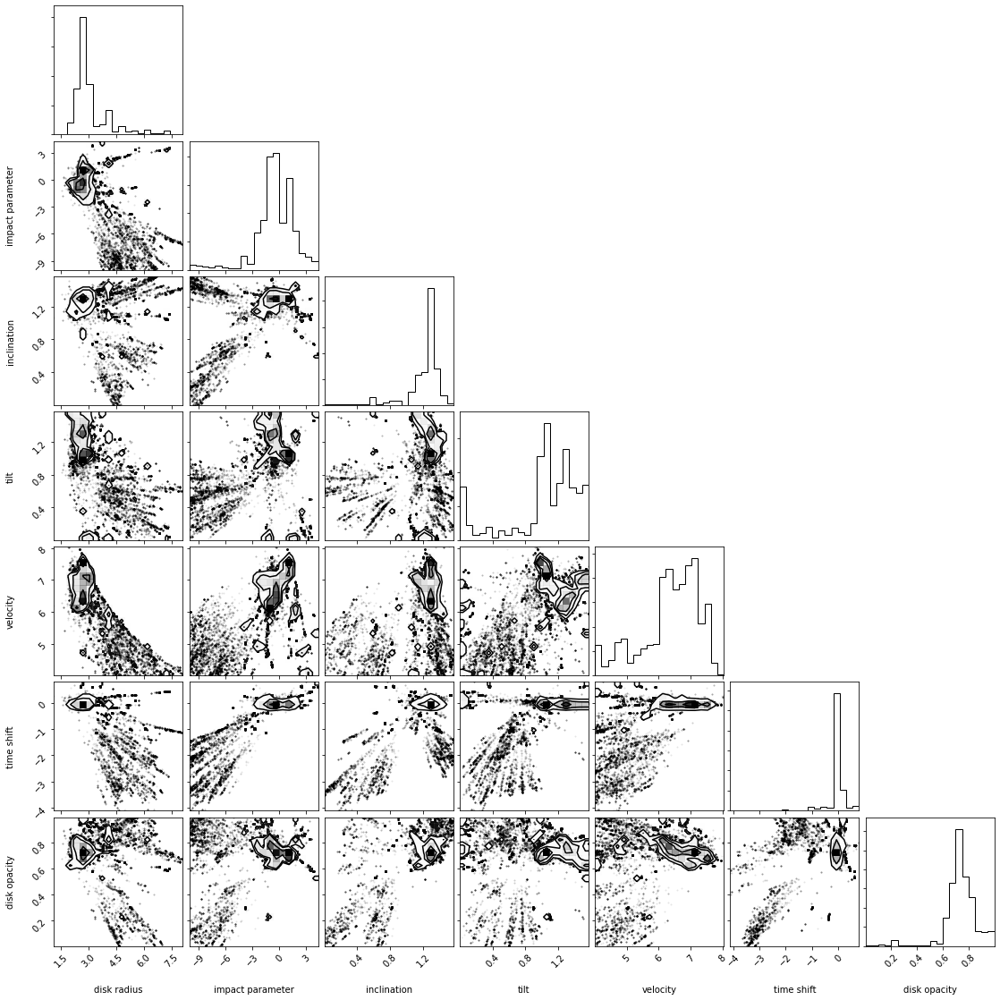

In [20]:
# plot the low velocity high disk radii solutions for the translucent disk
mcmc.plot_triangle(hdr_td, lbls=lbls_td)

We see no real solution, but that makes a lot of sense given that we have only 68 walkers. Note that this is less than 15% of the original sample. Due to this fact we scrap this solution.

# CHECK PB ON THIS AND DECIDE WHETHER TO EVEN CONSIDER IT

100%|██████████| 500/500 [00:28<00:00, 17.68it/s]


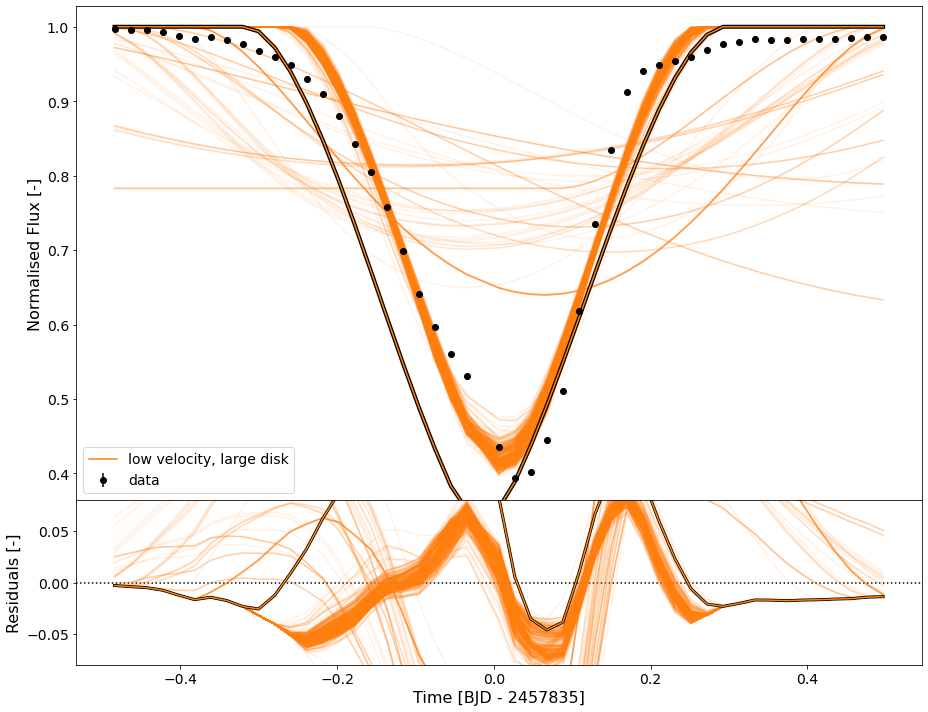

In [21]:
# determine burn-in for the low velocity high disk radii solutions for the translucent disk
cut_hdr_td = 1000

# carry out statistics for the low velocity high disk radii solutions for the translucent disk
stats_hdr_td, pb_hdr_td = mcmc.stats(hdr_td, cut=cut_hdr_td)

# plot samples for the low velocity high disk radii solutions for the translucent disk
_ = mcmc.plot_samples(time, flux, error, [translucent_disk], [hdr_td], ['low velocity, large disk'], cut_hdr_td,
                      500, best_fit=True, dt=3002, residual_lims=(-0.08, 0.08))

In [22]:
# print the best fit parameters for the low velocity high disk radii solutions for the translucent disk
mcmc.print_parameters(pb_hdr_td, lbls_td, units_td)

disk radius        =     +2.818071     [R*]
impact parameter   =     -0.283833     [R*]
inclination        =     +73.72978     [deg]
tilt               =     +61.16932     [deg]
velocity           =     +6.555087     [R*/day]
time shift         =     +0.007655     [day]
disk opacity       =     +0.721899     [-]


#### Low Velocity, Low Disk Radii Solutions for the Translucent Disk

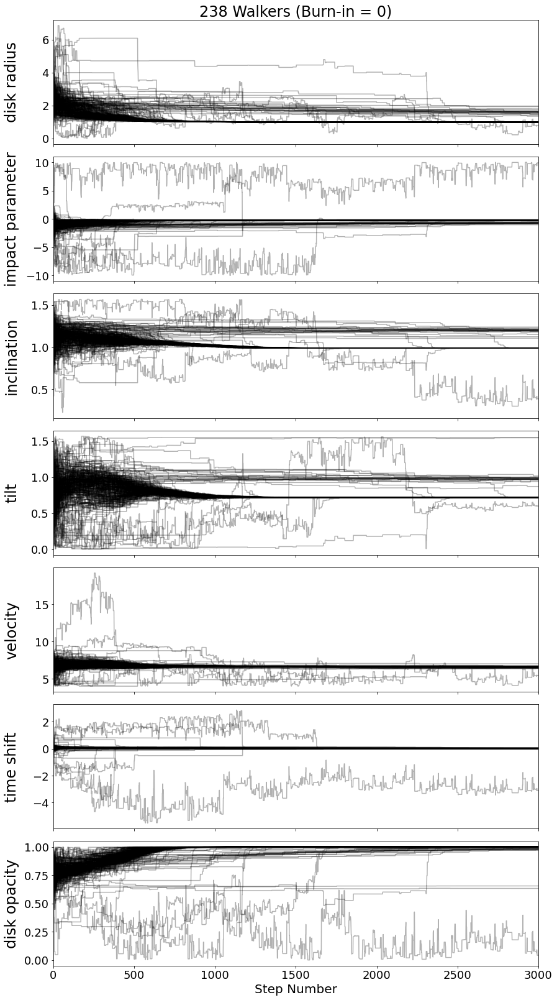

In [23]:
# plot the low velocity low disk radii walkers for the translucent disk
mcmc.plot_walkers(ldr_td, lbls=lbls_td)

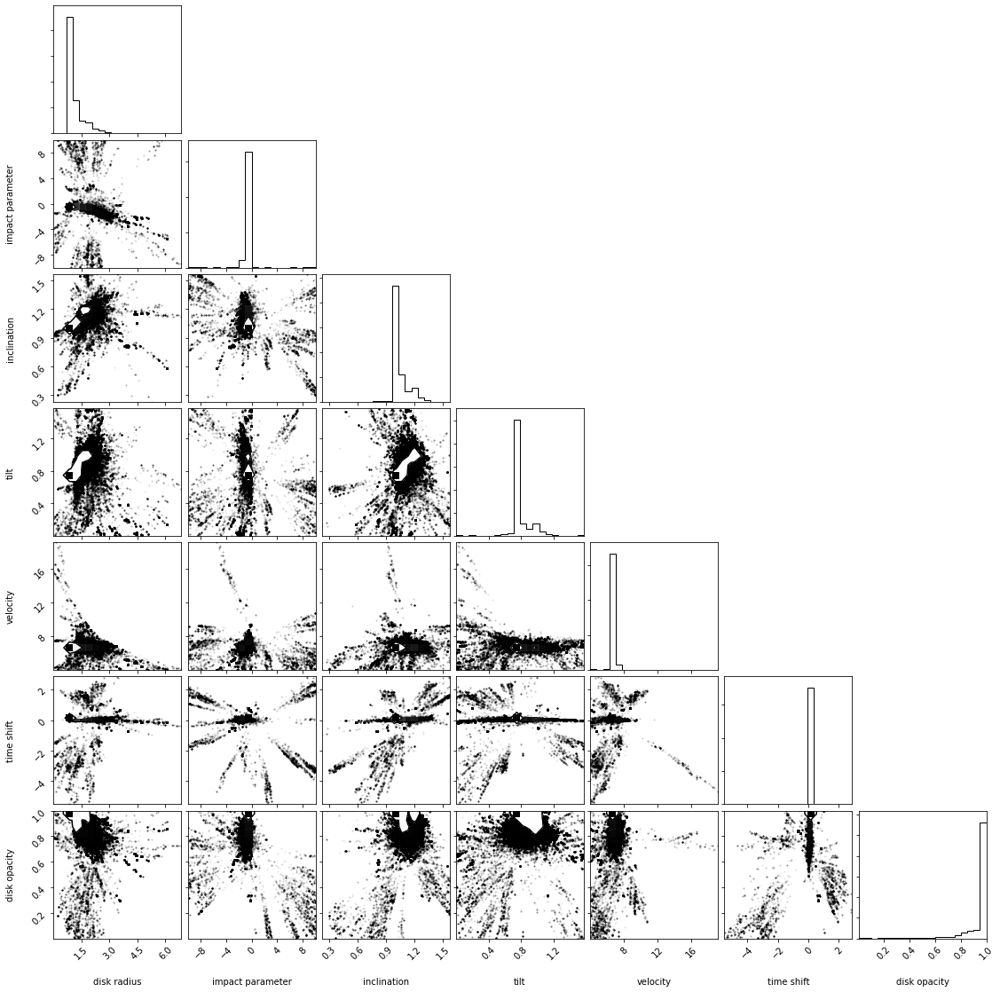

In [24]:
# plot the low velocity low disk radii triangle for the translucent disk
mcmc.plot_triangle(ldr_td, lbls=lbls_td)

Clearly one solution.

100%|██████████| 500/500 [00:39<00:00, 12.76it/s]


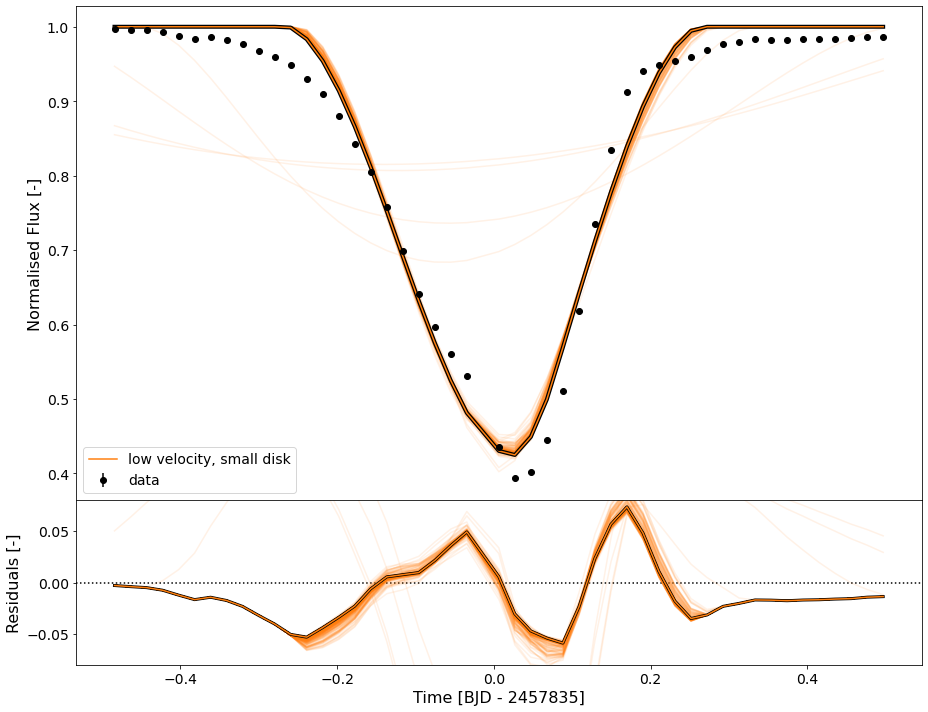

In [25]:
# determine the burn-in for the low velocity low disk radii solutions for the translucent disk
cut_ldr_td = 500

# carry out statistics for the low velocity low disk radii solutions for the translucent disk
stats_ldr_td, pb_ldr_td = mcmc.stats(ldr_td, cut=cut_ldr_td)

# plot the samples for the low velocity low disk radii solutions for the translucent disk
_ = mcmc.plot_samples(time, flux, error, [translucent_disk], [ldr_td], ['low velocity, small disk'], cut_ldr_td,
                      500, best_fit=True, dt=3002, residual_lims=(-0.08, 0.08))

In [26]:
# print the best fit parameters for the low velocity low disk radii solutions for the translucent disk
mcmc.print_parameters(pb_ldr_td, lbls_td, units_td)

disk radius        =     +0.992788     [R*]
impact parameter   =     -0.250574     [R*]
inclination        =     +56.80756     [deg]
tilt               =     +41.24993     [deg]
velocity           =     +6.637684     [R*/day]
time shift         =     +0.009910     [day]
disk opacity       =     +0.999996     [-]


### Compare Translucent Disk Solutions

Here we compare the translucent disk solutions discussed in the preceding sections

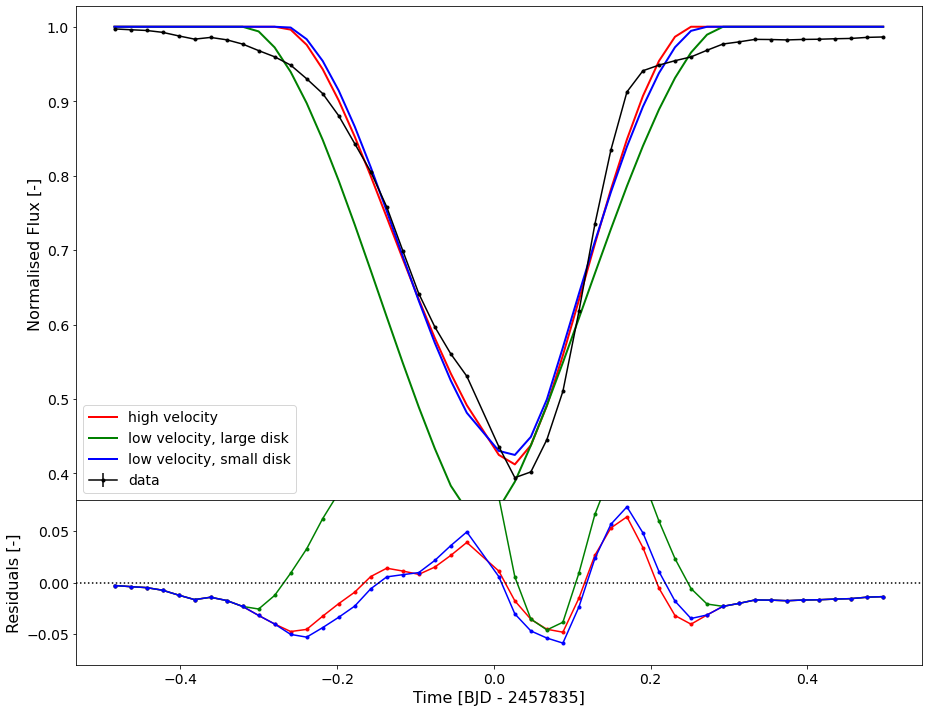

In [27]:
chi2s_td = mcmc.plot_models(time, flux, error, 3*[translucent_disk], [pb_hvel_td, pb_hdr_td, pb_ldr_td], 
                     ['high velocity', 'low velocity, large disk','low velocity, small disk'],
                     dt=3002, residual_lims=(-0.08, 0.08), lw=2)

In [28]:
print('chi2 for the translucent disk with high velocity is - %.6f' % chi2s_td[0])
print('chi2 for the translucent disk with low velocity, large disk is - %.6f' % chi2s_td[1])
print('chi2 for the translucent disk with low velocity, small disk is - %.6f' % chi2s_td[2])

chi2 for the translucent disk with high velocity is - 2753237.266559
chi2 for the translucent disk with low velocity, large disk is - 20705793.722417
chi2 for the translucent disk with low velocity, small disk is - 3540952.304685


In [29]:
# saving the best fit models for the translucent disks
np.save('models/best_fits/translucent_disk_high_velocity.npy', pb_hvel_td)
np.save('models/best_fits/translucent_disk_low_velocity_small_disk.npy', pb_ldr_td)

## Depict Disks

In this section a visual representation of the best-fit disks is presented.

In [ ]:
pb_hvel_td = np.load('models/best_fits/translucent_disk_high_velocity.npy')
pb_ldr_td  = np.load('models/best_fits/translucent_disk_low_velocity_small_disk.npy')
# defining model time
model_time = np.linspace(-0.5, 0.5, 1001)

In [ ]:
# for the high velocity opaque disk
r1, b1, i1, t1, v1, x1  = pb_hvel_td
lcm1 = eclipse.light_curve_model(model_time, [r1], b1, i1, t1, v1, x1, [1], 0.7220, 1, 0)
eclipse.make_plots(*lcm1, model_time, time, flux, error, 'V928 Tau - High Velocity Translucent Disk', dt=3002)